In [1]:
from google.colab import drive
drive.mount('/content/drive')

!pip -q install ultralytics

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 72.1 MB/s eta 0:00:00


In [14]:
from pathlib import Path
import datetime

ROOT = Path("/content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object")

SYNTH_ROOT = ROOT / "synth_controlnet"

KITTI_IMG_ROOT = ROOT / "data_object_image_2"
KITTI_LBL_ROOT = ROOT / "data_object_label_2"

N_BASE = 200

TRAIN_FRAC = 0.60
VAL_FRAC   = 0.20
TEST_FRAC = 0.20
STAMP = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
OUT_ROOT = ROOT / f"yolo_weather_{N_BASE}base_{STAMP}"
DATASET_ROOT = OUT_ROOT / "dataset"

print("ROOT:", ROOT)
print("SYNTH_ROOT:", SYNTH_ROOT)
print("KITTI_IMG_ROOT:", KITTI_IMG_ROOT)
print("KITTI_LBL_ROOT:", KITTI_LBL_ROOT)
print("OUT_ROOT:", OUT_ROOT)


ROOT: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object
SYNTH_ROOT: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/synth_controlnet
KITTI_IMG_ROOT: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/data_object_image_2
KITTI_LBL_ROOT: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/data_object_label_2
OUT_ROOT: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410


In [15]:
import glob
from pathlib import Path

def find_kitti_subdir(root: Path, must_contain: str, exts=(".png",".jpg",".jpeg")):
    candidates = [p for p in root.rglob("*") if p.is_dir() and must_contain in p.as_posix()]
    for c in candidates:
        files = []
        for e in exts:
            files.extend(list(c.glob(f"*{e}")))
        if len(files) > 0:
            return c
    return None

KITTI_IMG_DIR = find_kitti_subdir(KITTI_IMG_ROOT, "training/image_2")
KITTI_LBL_DIR = find_kitti_subdir(KITTI_LBL_ROOT, "training/label_2", exts=(".txt",))

assert KITTI_IMG_DIR is not None, f"❌ Can't find KITTI image dir under {KITTI_IMG_ROOT}"
assert KITTI_LBL_DIR is not None, f"❌ Can't find KITTI label dir under {KITTI_LBL_ROOT}"

print("✅ KITTI_IMG_DIR:", KITTI_IMG_DIR)
print("✅ KITTI_LBL_DIR:", KITTI_LBL_DIR)


✅ KITTI_IMG_DIR: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/data_object_image_2/training/image_2
✅ KITTI_LBL_DIR: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/data_object_label_2/training/label_2


In [16]:
import random, shutil
from PIL import Image
from tqdm import tqdm

KITTI_TO_YOLO = {
    "Pedestrian": 0,
    "Person_sitting": 0,
    "Car": 1, "Van": 1, "Truck": 1, "Tram": 1,
    "Cyclist": 2,
}
YOLO_NAMES = {0:"person", 1:"car", 2:"cyclist"}

EXTS = (".png",".jpg",".jpeg")

def find_image_by_stem(img_dir: Path, stem: str):
    for ext in EXTS:
        p = img_dir / f"{stem}{ext}"
        if p.exists():
            return p
    matches = list(img_dir.glob(f"{stem}.*"))
    for m in matches:
        if m.suffix.lower() in EXTS:
            return m
    return None

def kitti_label_to_yolo_lines(label_path: Path, w: int, h: int):
    if not label_path.exists():
        return []
    text = label_path.read_text().strip()
    if not text:
        return []
    out = []
    for line in text.splitlines():
        parts = line.split()
        if len(parts) < 8:
            continue
        cls = parts[0]
        if cls == "DontCare":
            continue
        if cls not in KITTI_TO_YOLO:
            continue

        cls_id = KITTI_TO_YOLO[cls]
        left, top, right, bottom = map(float, parts[4:8])

        x = ((left + right) / 2.0) / w
        y = ((top + bottom) / 2.0) / h
        bw = (right - left) / w
        bh = (bottom - top) / h

        x = min(max(x, 0.0), 1.0); y = min(max(y, 0.0), 1.0)
        bw = min(max(bw, 0.0), 1.0); bh = min(max(bh, 0.0), 1.0)

        out.append(f"{cls_id} {x:.6f} {y:.6f} {bw:.6f} {bh:.6f}")
    return out

def list_synth_stems(tag: str):
    img_dir = SYNTH_ROOT / tag / "images" / "train"
    assert img_dir.exists(), f"Missing synth dir: {img_dir}"
    imgs = []
    for e in EXTS:
        imgs += list(img_dir.glob(f"*{e}"))
    return img_dir, sorted({p.stem for p in imgs})

def ensure_dirs(root: Path):
    for split in ["train","val","test"]:
        (root / "images" / split).mkdir(parents=True, exist_ok=True)
        (root / "labels" / split).mkdir(parents=True, exist_ok=True)

def split_basenames(basenames, train_frac=0.8, val_frac=0.1, seed=42):
    basenames = list(basenames)
    random.seed(seed)
    random.shuffle(basenames)
    n = len(basenames)
    n_train = int(train_frac * n)
    n_val = int(val_frac * n)
    train = basenames[:n_train]
    val = basenames[n_train:n_train+n_val]
    test = basenames[n_train+n_val:]
    return train, val, test


In [17]:
import os

snow_dir, snow_stems = list_synth_stems("snow")
rain_dir, rain_stems = list_synth_stems("rain")
fog_dir,  fog_stems  = list_synth_stems("fog")

common_stems = set(snow_stems) & set(rain_stems) & set(fog_stems)
print("Common stems across snow/rain/fog:", len(common_stems))

ok_stems = []
for stem in common_stems:
    img_p = find_image_by_stem(KITTI_IMG_DIR, stem)
    lbl_p = KITTI_LBL_DIR / f"{stem}.txt"
    if img_p is not None and lbl_p.exists():
        ok_stems.append(stem)

ok_stems = sorted(ok_stems)
print("Common stems that also have real image+label:", len(ok_stems))

assert len(ok_stems) >= N_BASE, f" Need at least {N_BASE} valid stems, found {len(ok_stems)}"

random.seed(42)
chosen = ok_stems.copy()
random.shuffle(chosen)
chosen = chosen[:N_BASE]
chosen = sorted(chosen)
print("Chosen basenames:", len(chosen))

OUT_ROOT.mkdir(parents=True, exist_ok=True)
ensure_dirs(DATASET_ROOT)

train_bases, val_bases, test_bases = split_basenames(chosen, TRAIN_FRAC, VAL_FRAC, seed=42)
print("Split sizes (bases):", len(train_bases), len(val_bases), len(test_bases))

import cv2

def copy_one_image_and_label(img_path: Path, stem: str, split: str, out_name_stem: str):
    lbl_path = KITTI_LBL_DIR / f"{stem}.txt"

    real_img = find_image_by_stem(KITTI_IMG_DIR, stem)
    with Image.open(real_img) as im:
        w, h = im.size

    yolo_lines = kitti_label_to_yolo_lines(lbl_path, w, h)

    out_img = DATASET_ROOT / "images" / split / f"{out_name_stem}{img_path.suffix.lower()}"
    out_lbl = DATASET_ROOT / "labels" / split / f"{out_name_stem}.txt"

    with Image.open(img_path) as im2:
        if im2.size != (w, h):
            im2 = im2.resize((w, h))
            im2.save(out_img)
        else:
            shutil.copy2(img_path, out_img)

    out_lbl.write_text("\n".join(yolo_lines) + ("\n" if yolo_lines else ""), encoding="utf-8")
def add_split(split: str, bases, include_synth: bool):
    bases = list(bases)
    for stem in tqdm(bases, desc=f"Adding {split}"):
        real_img = find_image_by_stem(KITTI_IMG_DIR, stem)
        assert real_img is not None, f"Missing real image for {stem}"
        copy_one_image_and_label(real_img, stem, split, out_name_stem=stem)

        if include_synth:
            for tag in ["snow","rain","fog"]:
                synth_img = find_image_by_stem(SYNTH_ROOT / tag / "images" / "train", stem)
                assert synth_img is not None, f"Missing synth image for {tag}/{stem}"
                copy_one_image_and_label(synth_img, stem, split, out_name_stem=f"{tag}_{stem}")

add_split("train", train_bases, include_synth=True)
add_split("val",   val_bases,   include_synth=False)
add_split("test",  test_bases,  include_synth=False)


print("✅ Built dataset at:", DATASET_ROOT)


Common stems across snow/rain/fog: 200
Common stems that also have real image+label: 200
Chosen basenames: 200
Split sizes (bases): 120 40 40


Adding test: 100%|██████████| 40/40 [02:04<00:00,  3.11s/it]

✅ Built dataset at: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset


In [18]:
from collections import Counter

def count_images(split):
    return len(list((DATASET_ROOT/"images"/split).glob("*")))

def count_labels(split):
    return len(list((DATASET_ROOT/"labels"/split).glob("*.txt")))

for s in ["train","val","test"]:
    print(s, "images:", count_images(s), "| labels:", count_labels(s))

print("Total images:", sum(count_images(s) for s in ["train","val","test"]))
print("Total labels:", sum(count_labels(s) for s in ["train","val","test"]))


train images: 480 | labels: 480
val images: 40 | labels: 40
test images: 40 | labels: 40
Total images: 560
Total labels: 560


In [44]:
import yaml
from pathlib import Path
from ultralytics import YOLO

DATA_YAML = OUT_ROOT / "dataset.yaml"

yaml_dict = {
    "path": str(DATASET_ROOT),
    "train": "images/train",
    "val": "images/val",
    "names": YOLO_NAMES
}
if (DATASET_ROOT / "images" / "test").exists():
    yaml_dict["test"] = "images/test"

DATA_YAML.write_text(yaml.safe_dump(yaml_dict, sort_keys=False), encoding="utf-8")
print("Wrote:", DATA_YAML)

RUNS_DRIVE = OUT_ROOT / "runs_yolo"
RUNS_DRIVE.mkdir(parents=True, exist_ok=True)
print("RUNS_DRIVE:", RUNS_DRIVE)

model = YOLO("yolov8n.pt")
results = model.train(
    data=str(DATA_YAML),
    epochs=25,
    patience=3,
    imgsz=960,
    batch=16,
    device=0,
    lr0=0.003,
    weight_decay=0.001,
    project=str(RUNS_DRIVE),
    name="finetune_weather_200base",
    exist_ok=True,
    verbose=True
)

best_pt = Path(results.save_dir) / "weights" / "best.pt"
print("Best checkpoint:", best_pt)


Wrote: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset.yaml
RUNS_DRIVE: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/runs_yolo
New https://pypi.org/project/ultralytics/8.3.245 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0

In [45]:
import pandas as pd
import yaml
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO

baseline_model = YOLO("yolov8n.pt")
finetuned_model = YOLO(str(best_pt))

cfg = yaml.safe_load(Path(DATA_YAML).read_text())
dataset_path = Path(cfg["path"])

split_name = "test" if (dataset_path / "images" / "test").exists() else "val"
img_dir = dataset_path / "images" / split_name

print("Evaluating split:", split_name)
print("Image dir:", img_dir)

def write_img_list(out_txt: Path, filenames):
    out_txt.parent.mkdir(parents=True, exist_ok=True)
    out_txt.write_text("\n".join(str(img_dir / f) for f in filenames) + "\n", encoding="utf-8")

def subset_filenames(data_type: str):
    all_files = sorted([p.name for p in img_dir.iterdir() if p.is_file()])
    if data_type == "Real":
        return [f for f in all_files if not (f.startswith("snow_") or f.startswith("rain_") or f.startswith("fog_"))]
    if data_type == "Snow":
        return [f for f in all_files if f.startswith("snow_")]
    if data_type == "Rain":
        return [f for f in all_files if f.startswith("rain_")]
    if data_type == "Fog":
        return [f for f in all_files if f.startswith("fog_")]
    raise ValueError("Unknown data_type")

def make_eval_yaml(img_list_txt: Path, out_yaml: Path):
    new_cfg = dict(cfg)
    new_cfg["val"] = str(img_list_txt)
    out_yaml.write_text(yaml.safe_dump(new_cfg, sort_keys=False), encoding="utf-8")

def get_metrics(res):
    rd = getattr(res, "results_dict", {}) or {}

    def pick(*keys, fallback=None):
        for k in keys:
            if k in rd:
                return float(rd[k])
        return fallback

    map50 = pick("metrics/mAP50(B)", "metrics/mAP50", fallback=None)
    if map50 is None:
        map50 = float(getattr(res.box, "map50", 0.0))

    prec = pick("metrics/precision(B)", "metrics/precision", fallback=None)
    rec  = pick("metrics/recall(B)", "metrics/recall", fallback=None)
    if prec is None:
        prec = float(getattr(res.box, "mp", 0.0))
    if rec is None:
        rec = float(getattr(res.box, "mr", 0.0))

    f1 = (2 * prec * rec / (prec + rec)) if (prec + rec) > 0 else 0.0
    return map50, rec, prec, f1

def eval_on_list(model: YOLO, eval_yaml: Path):
    res = model.val(data=str(eval_yaml), split="val", device=0, verbose=False)
    return get_metrics(res)

tmp_dir = dataset_path / "_eval_lists"
rows = []

for data_type in ["Real", "Snow", "Rain", "Fog"]:
    files = subset_filenames(data_type)
    print(data_type, "num images:", len(files))
    if len(files) == 0:
        continue

    img_list = tmp_dir / f"{split_name.lower()}_{data_type.lower()}.txt"
    eval_yaml = tmp_dir / f"eval_{data_type.lower()}.yaml"
    write_img_list(img_list, files)
    make_eval_yaml(img_list, eval_yaml)


    mAP50, rec, prec, f1 = eval_on_list(baseline_model, eval_yaml)
    rows.append({"Data Type": data_type, "Model": "Baseline", "mAP50": mAP50, "Recall": rec, "Precision": prec, "F1": f1})


    mAP50, rec, prec, f1 = eval_on_list(finetuned_model, eval_yaml)
    rows.append({"Data Type": data_type, "Model": "Finetuned", "mAP50": mAP50, "Recall": rec, "Precision": prec, "F1": f1})

df_split = pd.DataFrame(rows)
df_split


Evaluating split: test
Image dir: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset/images/test
Real num images: 40
Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv8n summary (fused): 72 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 347.3±29.0 MB/s, size: 834.6 KB)
val: Scanning /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset/labels/test.cache... 40 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 40/40 71.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 2.4it/s 1.2s
                   all         40        198      0.272      0.167      0.179      0.093
Speed: 2.0ms preprocess, 5.4ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /content/runs/detect/val31
Ultr

,Data Type,Model,mAP50,Recall,Precision,F1
0,Real,Baseline,0.179276,0.166667,0.272403,0.206803
1,Real,Finetuned,0.630033,0.575360,0.755514,0.653244


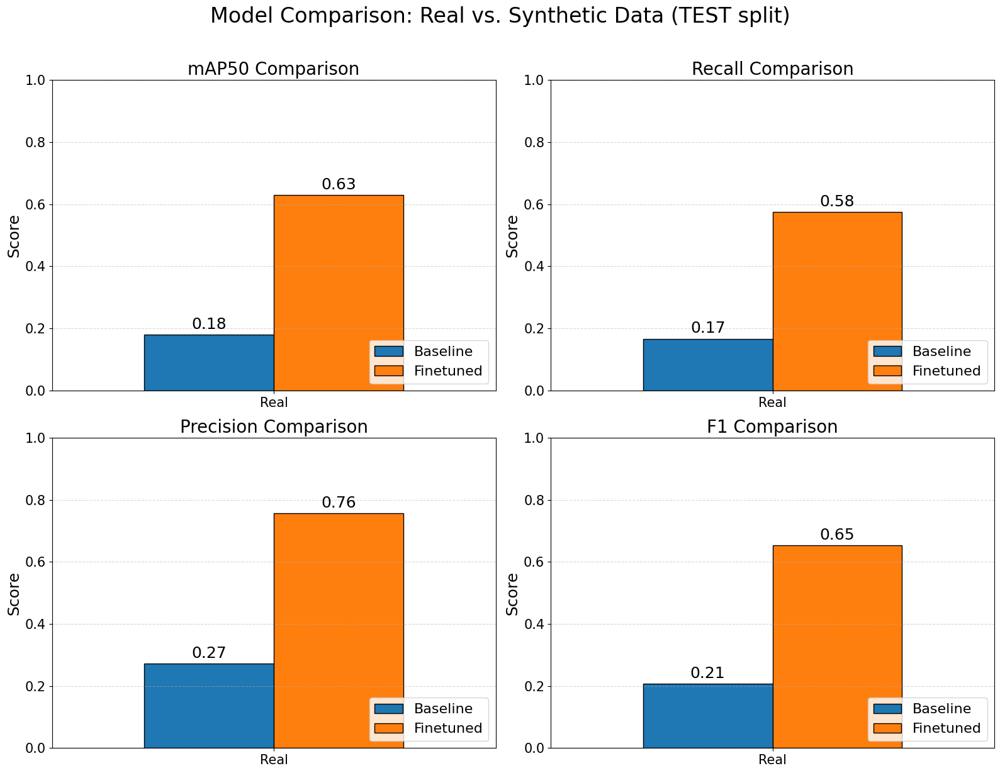

In [46]:
def plot_split_graphs(df):
    metrics = ['mAP50', 'Recall', 'Precision', 'F1']

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    colors = {'Baseline': '#1f77b4', 'Finetuned': '#ff7f0e'}

    for i, metric in enumerate(metrics):
        ax = axes[i]
        pivot_df = df.pivot(index='Data Type', columns='Model', values=metric)

        pivot_df.plot(kind='bar', ax=ax, color=[colors[c] for c in pivot_df.columns],
                      width=0.7, edgecolor='black', rot=0)

        ax.set_title(f'{metric} Comparison', fontsize=20)
        ax.set_ylabel('Score', fontsize=18)
        ax.set_xlabel('')
        ax.tick_params(axis='both', which='major', labelsize=15)
        ax.set_ylim(0, 1.0)
        ax.grid(axis='y', linestyle='--', alpha=0.5)
        ax.legend(loc='lower right', fontsize=16)

        for container in ax.containers:
            ax.bar_label(container, fmt='%.2f', padding=3, fontsize=18)

    plt.suptitle(f"Model Comparison: Real vs. Synthetic Data ({split_name.upper()} split)", fontsize=24, y=1.02)
    plt.tight_layout()
    plt.show()

if 'df_split' in locals() and not df_split.empty:
    plot_split_graphs(df_split)
else:
    print(" No data to plot. Please run the df_split cell first.")


Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 202.2±94.1 MB/s, size: 669.8 KB)
val: Scanning /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset/labels/train.cache... 480 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 480/480 699.5Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 30/30 7.0it/s 4.3s
                   all        480       2548      0.743      0.619       0.73      0.444
Speed: 0.8ms preprocess, 1.0ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to /content/runs/detect/val33
Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 347.1±39.9 MB/s, size: 803.7 KB)
val: Scanning /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weat

,conf_used,mAP50-95,mAP50,Precision,Recall,F1
split,,,,,,
train,0.001,0.444319,0.730016,0.742585,0.619024,0.675198
val,0.001,0.350386,0.584596,0.550416,0.608889,0.578178
test,0.001,0.338567,0.630033,0.755514,0.575360,0.653244


,mAP50-95 gap(train-split),mAP50 gap(train-split),Precision gap(train-split),Recall gap(train-split),F1 gap(train-split)
split,,,,,
val,0.093933,0.145419,0.192170,0.010135,0.097020
test,0.105752,0.099983,-0.012928,0.043663,0.021954


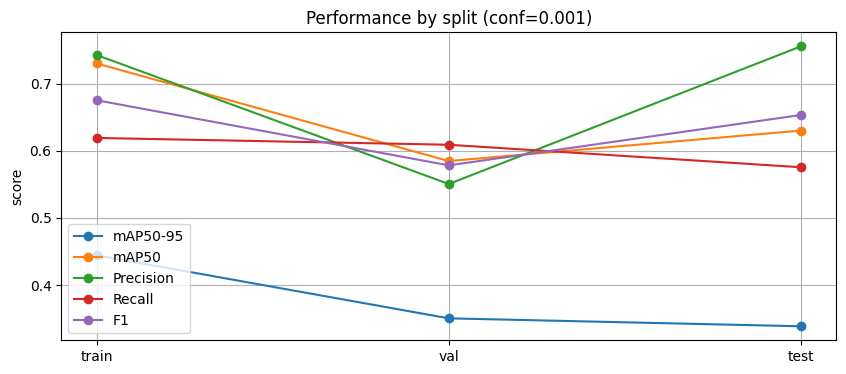

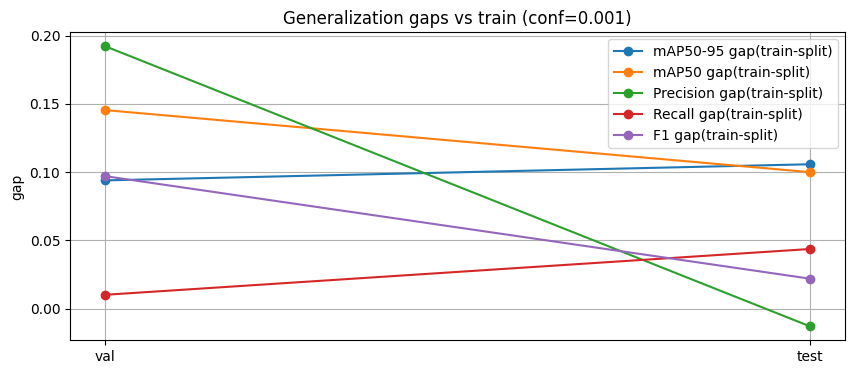

Overfit flags: {'val': 'OK', 'test': 'OK'}
Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 322.5±58.8 MB/s, size: 690.2 KB)
val: Scanning /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset/labels/train.cache... 480 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 480/480 731.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 30/30 7.2it/s 4.2s
                   all        480       2548      0.815      0.562      0.725       0.51
Speed: 0.8ms preprocess, 1.4ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/runs/detect/val36
Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 382.0±28.7 MB/s, size: 781.8 KB)
val: Scanning /content/drive/MyDrive/genai proj Au

,conf_used,mAP50-95,mAP50,Precision,Recall,F1
split,,,,,,
train,0.25,0.509761,0.724611,0.815117,0.562184,0.665425
val,0.25,0.343277,0.516373,0.549221,0.434921,0.485433
test,0.25,0.424910,0.718343,0.900223,0.492475,0.636659


,mAP50-95 gap(train-split),mAP50 gap(train-split),Precision gap(train-split),Recall gap(train-split),F1 gap(train-split)
split,,,,,
val,0.166484,0.208239,0.265896,0.127263,0.179992
test,0.084851,0.006269,-0.085106,0.069709,0.028766


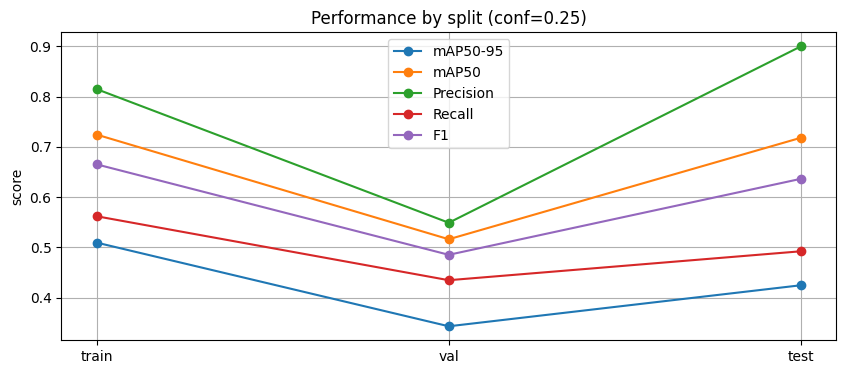

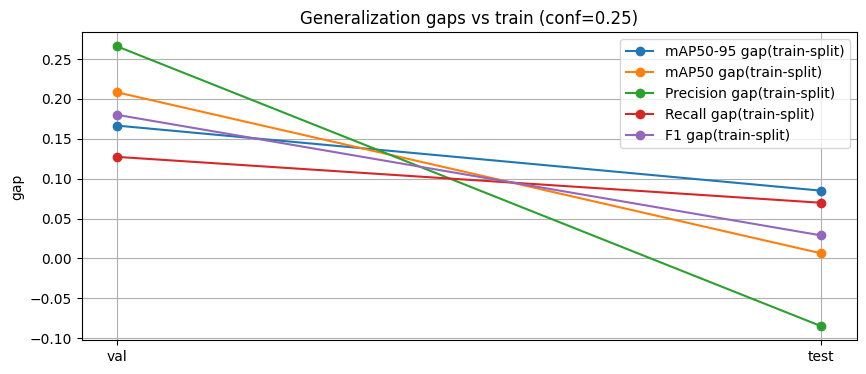

Overfit flags: {'val': '⚠️ overfit suspected', 'test': 'OK'}


In [47]:
import pandas as pd
import matplotlib.pyplot as plt

def eval_split(model, data_yaml, split, device=0, conf=0.001, iou=0.7):
    r = model.val(data=str(data_yaml), split=split, device=device, conf=conf, iou=iou, verbose=False)
    P = float(r.box.mp)
    R = float(r.box.mr)
    F1 = (2*P*R/(P+R)) if (P+R) > 0 else 0.0
    return {
        "split": split,
        "conf_used": conf,
        "mAP50-95": float(r.box.map),
        "mAP50": float(r.box.map50),
        "Precision": P,
        "Recall": R,
        "F1": F1,
    }

def overfit_report(model, data_yaml, device=0, conf=0.001, iou=0.7):
    rows = []
    for sp in ["train", "val", "test"]:
        try:
            rows.append(eval_split(model, data_yaml, sp, device=device, conf=conf, iou=iou))
        except Exception as e:
            rows.append({"split": sp, "error": str(e)})

    df = pd.DataFrame(rows).set_index("split")
    display(df)

    if "error" in df.columns and df["error"].notna().any():
        return df

    train = df.loc["train"]
    gaps = (train[["mAP50-95","mAP50","Precision","Recall","F1"]] -
            df[["mAP50-95","mAP50","Precision","Recall","F1"]]).drop(index="train")
    gaps.columns = [c + " gap(train-split)" for c in gaps.columns]
    display(gaps)

    plt.figure(figsize=(10,4))
    for col in ["mAP50-95","mAP50","Precision","Recall","F1"]:
        plt.plot(df.index, df[col], marker="o", label=col)
    plt.title(f"Performance by split (conf={conf})")
    plt.ylabel("score")
    plt.grid(True)
    plt.legend()
    plt.show()

    plt.figure(figsize=(10,4))
    for col in gaps.columns:
        plt.plot(gaps.index, gaps[col], marker="o", label=col)
    plt.title(f"Generalization gaps vs train (conf={conf})")
    plt.ylabel("gap")
    plt.grid(True)
    plt.legend()
    plt.show()

    flags = {}
    for sp in ["val", "test"]:
        if sp in df.index:
            gap_map = float(train["mAP50-95"] - df.loc[sp, "mAP50-95"])
            gap_rec = float(train["Recall"] - df.loc[sp, "Recall"])
            flags[sp] = "⚠️ overfit suspected" if (gap_map >= 0.15 or gap_rec >= 0.15) else "OK"
    print("Overfit flags:", flags)

    return df, gaps, flags

df_001, gaps_001, flags_001 = overfit_report(finetuned_model, DATA_YAML, device=0, conf=0.001)

df_025, gaps_025, flags_025 = overfit_report(finetuned_model, DATA_YAML, device=0, conf=0.25)


In [48]:
import random
from pathlib import Path
import yaml
import matplotlib.pyplot as plt
from ultralytics import YOLO

baseline_model = YOLO("yolov8s.pt")
finetuned_model = YOLO(str(best_pt))

cfg = yaml.safe_load(Path(DATA_YAML).read_text())
dataset_path = Path(cfg["path"])

split_name = "test" if (dataset_path / "images" / "test").exists() else "val"
img_dir = dataset_path / "images" / split_name

print("Split:", split_name)
print("Images:", img_dir)


Split: test
Images: /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset/images/test


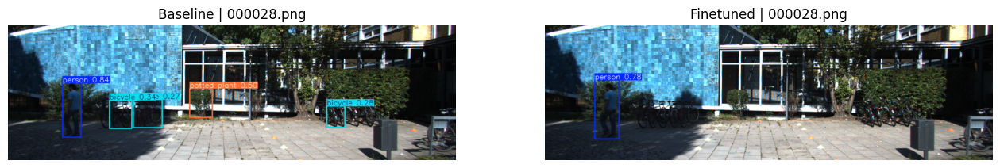

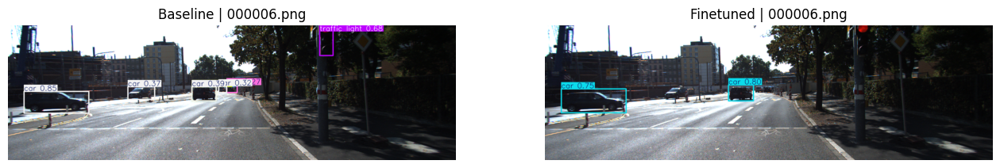

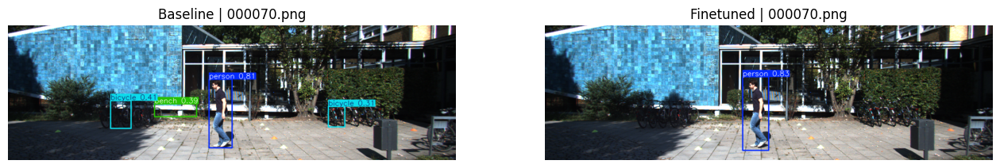

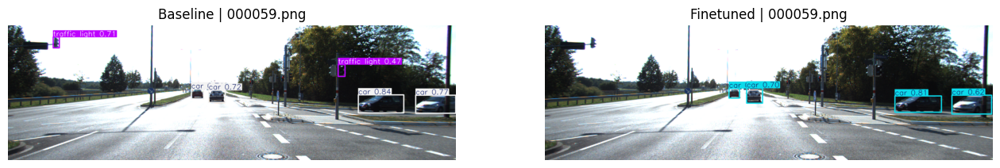

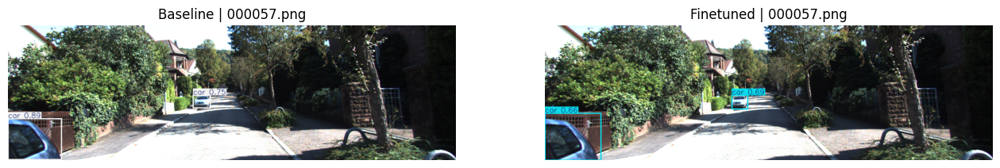

...

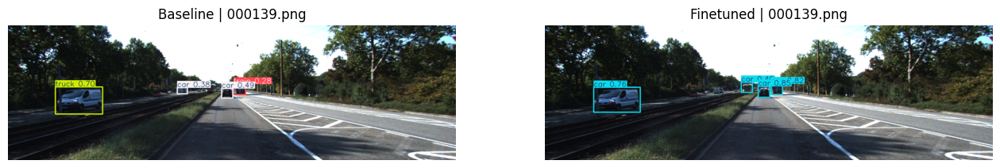

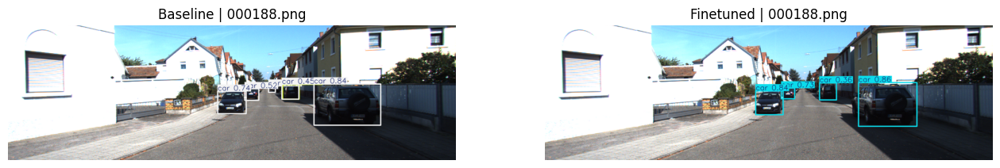

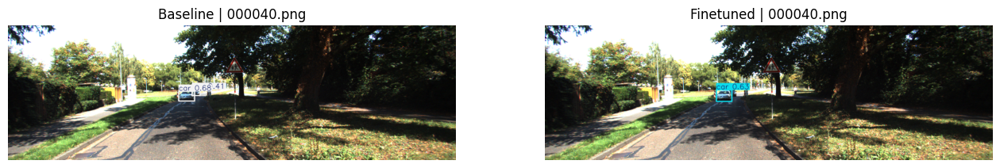

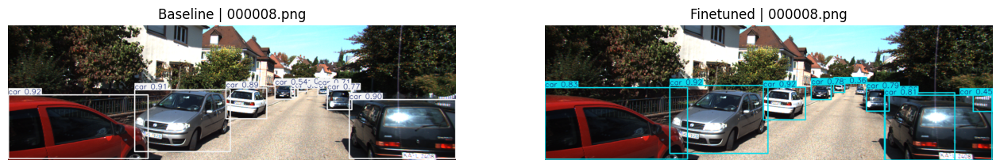

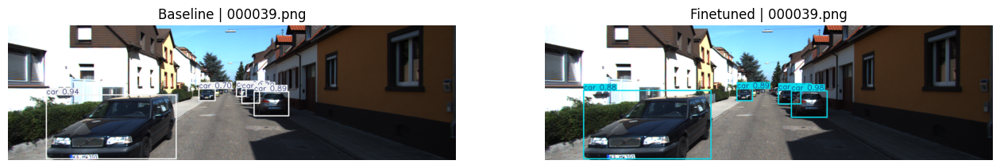

In [49]:
import numpy as np

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def list_images(data_type="Real"):
    files = sorted([p for p in img_dir.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS])
    if data_type == "Real":
        return [p for p in files if not (p.name.startswith("snow_") or p.name.startswith("rain_") or p.name.startswith("fog_"))]
    if data_type == "Snow":
        return [p for p in files if p.name.startswith("snow_")]
    if data_type == "Rain":
        return [p for p in files if p.name.startswith("rain_")]
    if data_type == "Fog":
        return [p for p in files if p.name.startswith("fog_")]
    raise ValueError("data_type must be one of: Real, Snow, Rain, Fog")

def predict_plot(model, img_path, conf=0.25, iou=0.7, imgsz=640):
    res = model.predict(
        source=str(img_path),
        conf=conf,
        iou=iou,
        imgsz=imgsz,
        device=0,
        verbose=False
    )[0]
    im = res.plot()
    im = im[..., ::-1]
    return im

def show_baseline_vs_finetuned(n=8, data_type="Real", conf=0.25, iou=0.7, imgsz=640, seed=42):
    random.seed(seed)
    imgs = list_images(data_type)
    if len(imgs) == 0:
        print(f"No images found for data_type={data_type} in {img_dir}")
        return

    sample = random.sample(imgs, min(n, len(imgs)))

    for img_path in sample:
        im_base = predict_plot(baseline_model, img_path, conf=conf, iou=iou, imgsz=imgsz)
        im_fine = predict_plot(finetuned_model, img_path, conf=conf, iou=iou, imgsz=imgsz)

        plt.figure(figsize=(16, 7))
        plt.subplot(1, 2, 1)
        plt.imshow(im_base)
        plt.axis("off")
        plt.title(f"Baseline | {img_path.name}")

        plt.subplot(1, 2, 2)
        plt.imshow(im_fine)
        plt.axis("off")
        plt.title(f"Finetuned | {img_path.name}")

        plt.show()

show_baseline_vs_finetuned(n=50, data_type="Real", conf=0.25, iou=0.7, imgsz=640)


In [50]:
import yaml
from pathlib import Path
import pandas as pd
from ultralytics import YOLO

baseline = YOLO("yolov8s.pt")
finetuned = YOLO(str(best_pt))

cfg = yaml.safe_load(Path(DATA_YAML).read_text())
dataset_path = Path(cfg["path"])

split_name = "test" if (dataset_path / "images" / "test").exists() else "val"
img_dir = dataset_path / "images" / split_name

IMG_EXTS = {".jpg",".jpeg",".png",".bmp",".webp"}

def real_only_list():
    files = sorted([p.name for p in img_dir.iterdir() if p.is_file() and p.suffix.lower() in IMG_EXTS])
    return [f for f in files if not (f.startswith("snow_") or f.startswith("rain_") or f.startswith("fog_"))]

def write_list(out_txt: Path, base_dir: Path, files):
    out_txt.parent.mkdir(parents=True, exist_ok=True)
    out_txt.write_text("\n".join(str(base_dir / f) for f in files) + "\n", encoding="utf-8")

def make_eval_yaml(img_list_txt: Path, out_yaml: Path):
    new_cfg = dict(cfg)
    new_cfg["val"] = str(img_list_txt)
    out_yaml.write_text(yaml.safe_dump(new_cfg, sort_keys=False), encoding="utf-8")

def get_metrics(res):
    rd = getattr(res, "results_dict", {}) or {}
    def pick(*keys, fallback=None):
        for k in keys:
            if k in rd:
                return float(rd[k])
        return fallback
    map5095 = pick("metrics/mAP50-95(B)", "metrics/mAP50-95", fallback=float(getattr(res.box, "map", 0.0)))
    map50   = pick("metrics/mAP50(B)", "metrics/mAP50", fallback=float(getattr(res.box, "map50", 0.0)))
    prec    = pick("metrics/precision(B)", "metrics/precision", fallback=float(getattr(res.box, "mp", 0.0)))
    rec     = pick("metrics/recall(B)", "metrics/recall", fallback=float(getattr(res.box, "mr", 0.0)))
    f1 = (2*prec*rec/(prec+rec)) if (prec+rec)>0 else 0.0
    return map5095, map50, prec, rec, f1

files = real_only_list()
print("Split:", split_name, "| RealOnly:", len(files))

tmp = dataset_path / "_eval_lists"
tmp.mkdir(parents=True, exist_ok=True)
lst = tmp / f"{split_name}_realonly.txt"
yml = tmp / f"eval_{split_name}_realonly.yaml"
write_list(lst, img_dir, files)
make_eval_yaml(lst, yml)

rows = []
for conf in [0.001, 0.05, 0.1, 0.25]:
    for name, model in [("Baseline", baseline), ("Finetuned", finetuned)]:
        res = model.val(data=str(yml), split="val", device=0, conf=conf, iou=0.7, verbose=False)
        m5095, m50, p, r, f1 = get_metrics(res)
        rows.append({"Subset":"TestRealOnly", "conf":conf, "Model":name,
                     "mAP50-95":m5095, "mAP50":m50, "Precision":p, "Recall":r, "F1":f1})

pd.DataFrame(rows).sort_values(["conf","Model"])


Split: test | RealOnly: 40
Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
YOLOv8s summary (fused): 72 layers, 11,156,544 parameters, 0 gradients, 28.6 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 302.3±43.1 MB/s, size: 767.2 KB)
val: Scanning /content/drive/MyDrive/genai proj Autonomous Vehicles/dataroad/object/yolo_weather_200base_20260101_001410/dataset/labels/test.cache... 40 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 40/40 53.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 2.2it/s 1.3s
                   all         40        198       0.24      0.167      0.183     0.0894
Speed: 1.7ms preprocess, 3.6ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to /content/runs/detect/val39
Ultralytics 8.3.244 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA L4, 22693MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1

,Subset,conf,Model,mAP50-95,mAP50,Precision,Recall,F1
0,TestRealOnly,0.001,Baseline,0.089438,0.183462,0.239667,0.166667,0.196609
1,TestRealOnly,0.001,Finetuned,0.338567,0.630033,0.755514,0.575360,0.653244
2,TestRealOnly,0.050,Baseline,0.093733,0.186687,0.239667,0.166667,0.196609
3,TestRealOnly,0.050,Finetuned,0.374147,0.671724,0.755514,0.575360,0.653244
4,TestRealOnly,0.100,Baseline,0.097628,0.191271,0.239667,0.166667,0.196609
5,TestRealOnly,0.100,Finetuned,0.406434,0.716709,0.755514,0.575360,0.653244
6,TestRealOnly,0.250,Baseline,0.105562,0.197643,0.239667,0.166667,0.196609
7,TestRealOnly,0.250,Finetuned,0.424910,0.718343,0.900223,0.492475,0.636659
